In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np

from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [10, 5]
mpl.rcParams['figure.dpi'] = 300

from tqdne.conf import Config
dataset_path = Config().datapath

In [3]:
import h5py

def load_waveforms_from_h5_dataset(file_path, n_samples=100000):
    with h5py.File(file_path, 'r') as f:
        waveforms = f['waveforms'][:, :, :n_samples]
    return waveforms

waveforms = load_waveforms_from_h5_dataset(dataset_path)
waveforms.shape

(3, 5501, 100000)

In [4]:
def plot_envelope(signal, title, envelope_function, **envelope_params):
    envelope = envelope_function(signal, **envelope_params)
    #print(np.where(envelope == 0))

    fig = plt.figure()
    
    ax1 = fig.add_subplot(211)
    ax1.plot(signal, alpha=0.6, label='signal')
    ax1.plot(envelope, linewidth=1,  label='envelope')
    ax1.set_title(title)
    ax1.legend()

    ax2 = fig.add_subplot(212)
    sig_scaledbyenvelope = np.nan_to_num(signal/(envelope+1e-2), nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small. 
    argmin_sig_env = np.argmin(sig_scaledbyenvelope)

    ax2.plot(sig_scaledbyenvelope)
    #ax2.axvline(x=argmin_sig_env, color='r', linestyle='--')
    ax2.set_title("Signal scaled by its envelope")
    
    plt.tight_layout()
    plt.show()

    return envelope, sig_scaledbyenvelope, argmin_sig_env

# Trying Different Envelopes 

In [28]:
def envelope_first_order_lp(signal, k_env):
    envelope = signal.copy()
    #signal = np.abs(signal)
    for i in range(1, len(signal)):
        if signal[i] > signal[i-1] and signal[i] > envelope[i-1]:
            envelope[i] = signal[i]
        else:
            envelope[i] = k_env*envelope[i-1] + (1-k_env)*signal[i] # first order discrete time low pass filter
    return envelope

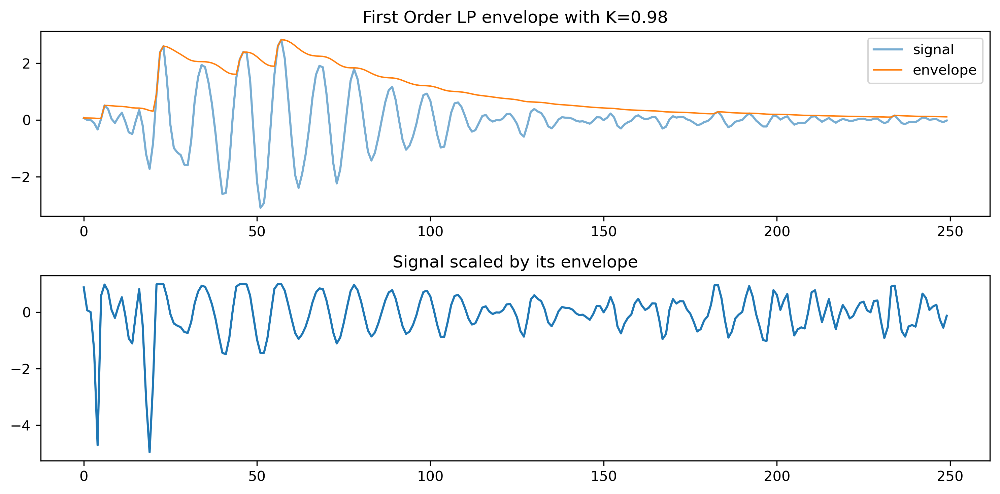

In [21]:
sample_idx = 3
env_params = {'k_env': 0.98}
k_env = env_params['k_env']
env, sig_scaledbyenv, argmin_sig_env = plot_envelope(np.nan_to_num(waveforms[0, 600:850, sample_idx], nan=0), title=f'First Order LP envelope with K={k_env}', envelope_function=envelope_first_order_lp, **env_params)

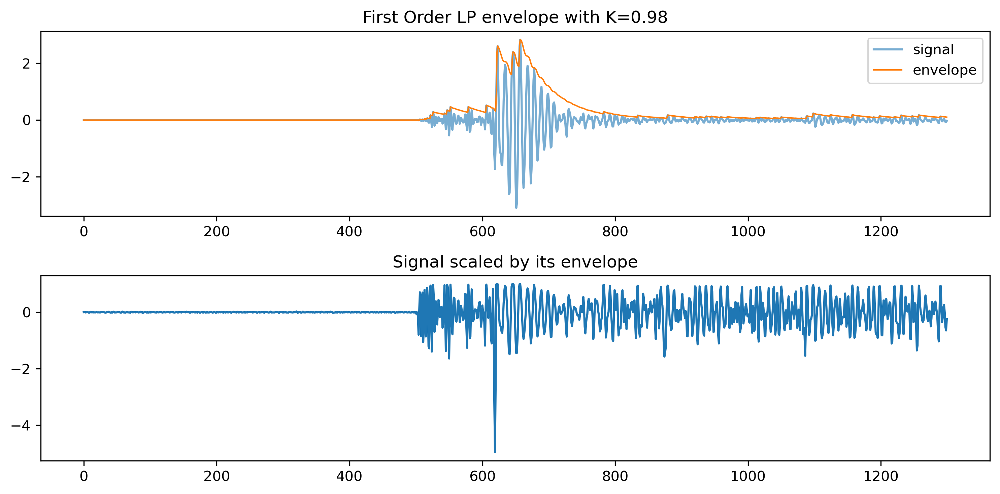

In [22]:
env, sig_scaledbyenv, argmin_sig_env = plot_envelope(np.nan_to_num(waveforms[0, :1300, sample_idx], nan=0), title=f'First Order LP envelope with K={k_env}', envelope_function=envelope_first_order_lp, **env_params)

In [8]:
sig_scaledbyenv[argmin_sig_env], waveforms[0, argmin_sig_env, sample_idx], env[argmin_sig_env], waveforms[0, argmin_sig_env, sample_idx]/env[argmin_sig_env]

(-7.980485367331321,
 -0.0008978927966714499,
 0.00011251105106301396,
 -7.980485367331321)

Meaningless envelope. 

In [26]:
def envelope_third_order_lp(signal, k_env1, k_env2, k_env3):
    envelope = np.zeros(len(signal))
    for i in range(3, len(signal)-1):
        if signal[i] > signal[i-1]:
            envelope[i] = signal[i]
        else:
            envelope[i] = k_env1*envelope[i-1] + k_env2*envelope[i-2] + k_env3*envelope[i-3] + (1-k_env1)*signal[i] # first order discrete time low pass filter
    return envelope

/tmp/ipykernel_26944/1293647127.py:13: RuntimeWarning: divide by zero encountered in divide
  sig_scaledbyenvelope = np.nan_to_num(signal/envelope, nan=0., posinf=0., neginf=0.) # since if the envelope is 0, the signal is also small.


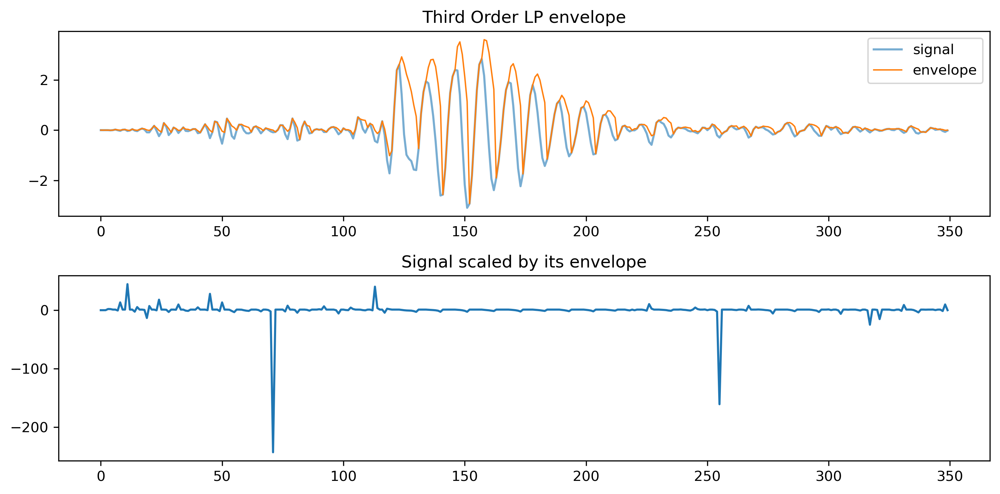

(array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -4.48946398e-04,
        -4.19327334e-03,  3.83757730e-04,  2.40172009e-02,  8.86791927e-03,
        -2.07032453e-03,  1.68215027e-02,  2.31024907e-02, -7.61299150e-04,
        -1.33359096e-02,  3.92368994e-02,  6.78805797e-03, -7.50365821e-03,
         2.33253830e-02,  6.54134115e-02,  5.08942278e-02,  6.47507361e-03,
        -1.23200627e-02,  5.18226625e-02,  1.73904497e-01,  8.76037789e-02,
        -1.33226280e-02, -7.78398138e-02,  2.84673243e-01,  1.83361130e-01,
         6.35376413e-02, -8.85818297e-02,  1.05022793e-01,  6.21079239e-02,
        -1.15874229e-02,  1.19099535e-03,  1.10431074e-01,  3.80894908e-02,
         3.20338109e-02, -4.79927101e-03,  4.36385611e-02,  4.74574211e-02,
        -2.49805192e-02, -9.63157075e-02,  7.19648461e-02,  2.36863180e-01,
         1.24212338e-01, -1.13816040e-02, -8.29880756e-02,  3.47230806e-01,
         3.04202430e-01,  1.35405207e-01, -4.05479398e-02, -8.98933325e-02,
         4.6

In [27]:
sample_idx = 3
env_params = {'k_env1': 0.5, 'k_env2': 0.3, 'k_env3': 0.2}
plot_envelope(waveforms[0, 500:850, sample_idx], title='Third Order LP envelope', envelope_function=envelope_third_order_lp, **env_params)

Meaningless envelope still. 

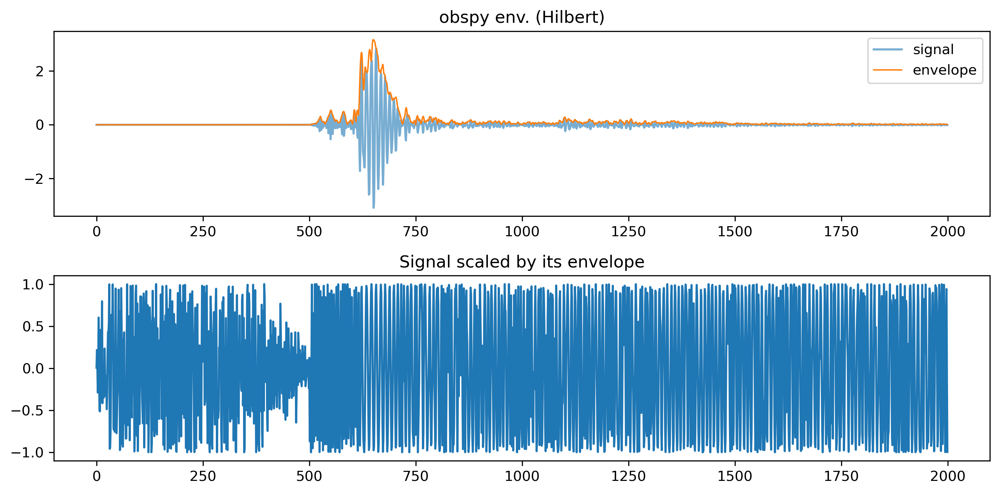

False


In [9]:
import obspy.signal.filter

sample_idx = 3
plot_envelope(waveforms[0, :2000, sample_idx], title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

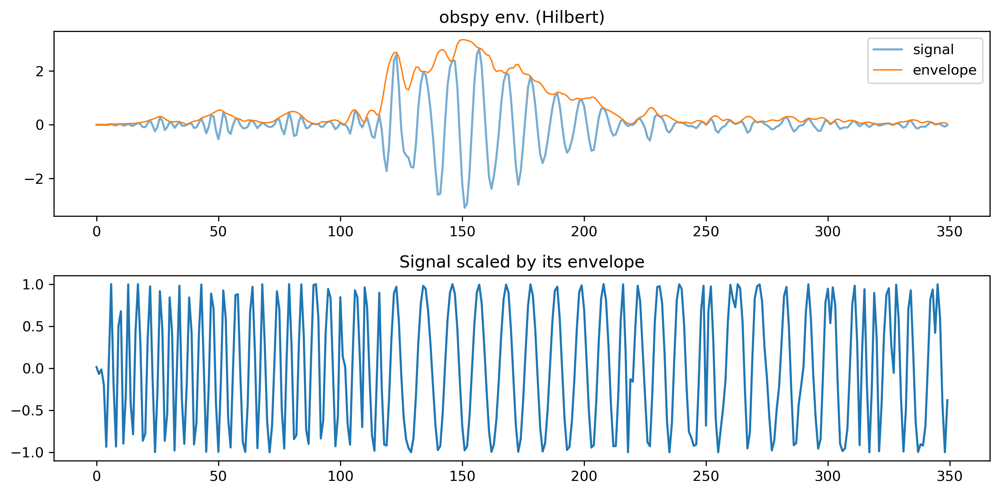

False


In [10]:
plot_envelope(waveforms[0, 500:850, sample_idx], title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

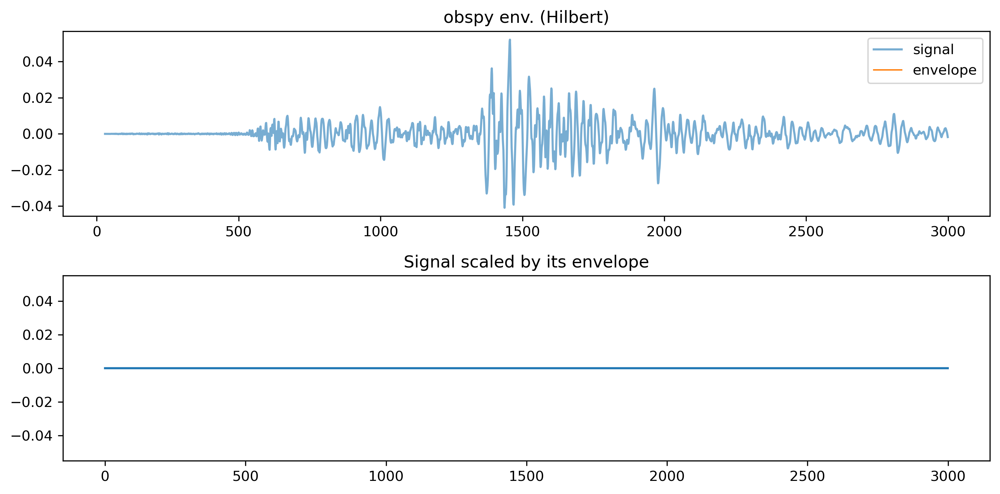

True


In [11]:
sample_idx = 0
plot_envelope(waveforms[0, :3000, sample_idx], title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveforms[0, :, sample_idx])))

Envelope is NaN because the waveforms contains NaNs. 

In [12]:
def plot_nans(signal):
    # Get the indices where NaN values are present
    nan_indices = np.where(np.isnan(signal))[0]

    # Get the indices where NaN values are not present
    not_nan_indices = np.where(~np.isnan(signal))[0]

    # Plot the non-NaN values
    plt.plot(not_nan_indices, signal[not_nan_indices], 'b-', label='Data')

    # Plot the NaN values
    plt.plot(nan_indices, np.zeros_like(nan_indices), 'rx', label='NaN')

    plt.legend()
    plt.show()

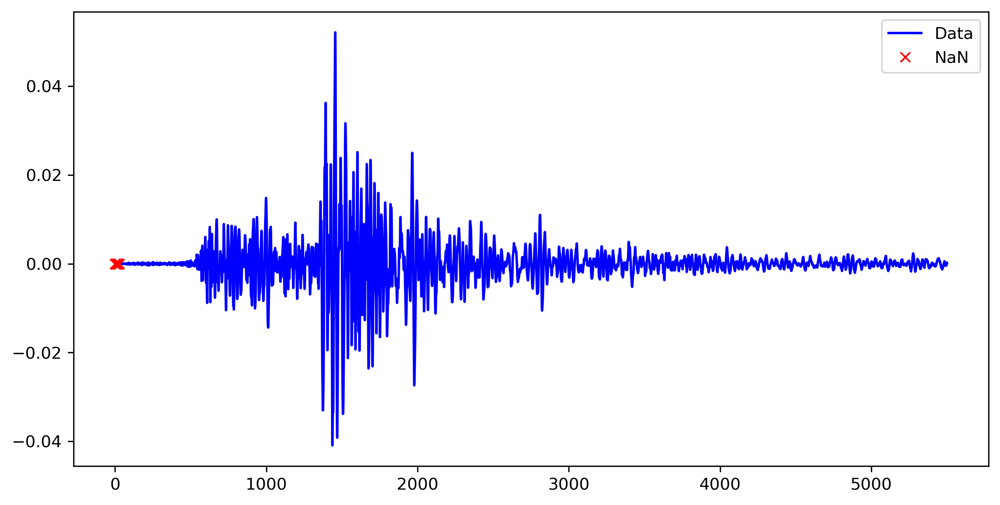

In [13]:
plot_nans(waveforms[0, :, sample_idx])

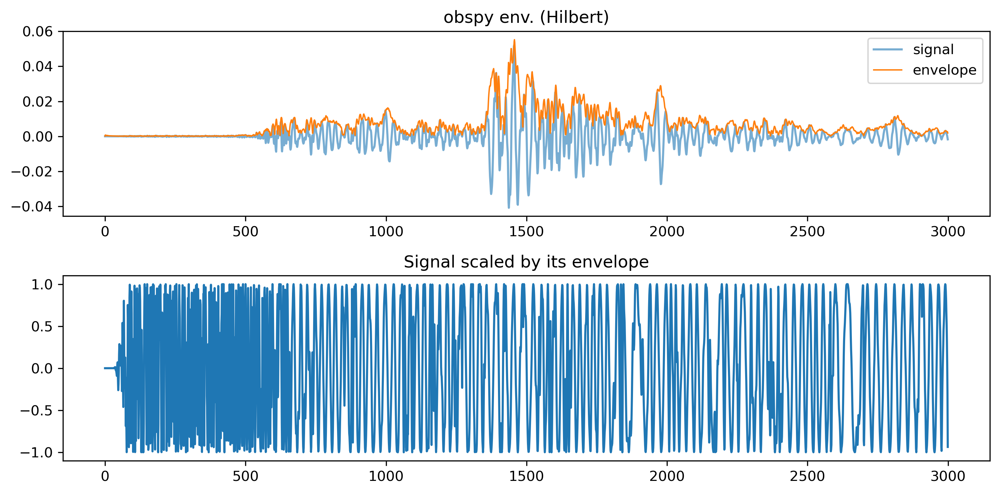

False


In [14]:
sample_idx = 0
waveform = np.nan_to_num(waveforms[0, :3000, sample_idx], nan=0) # since it seems that the NaNs are at the edges of the signal, we can just replace them with 0
plot_envelope(waveform, title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveform)))

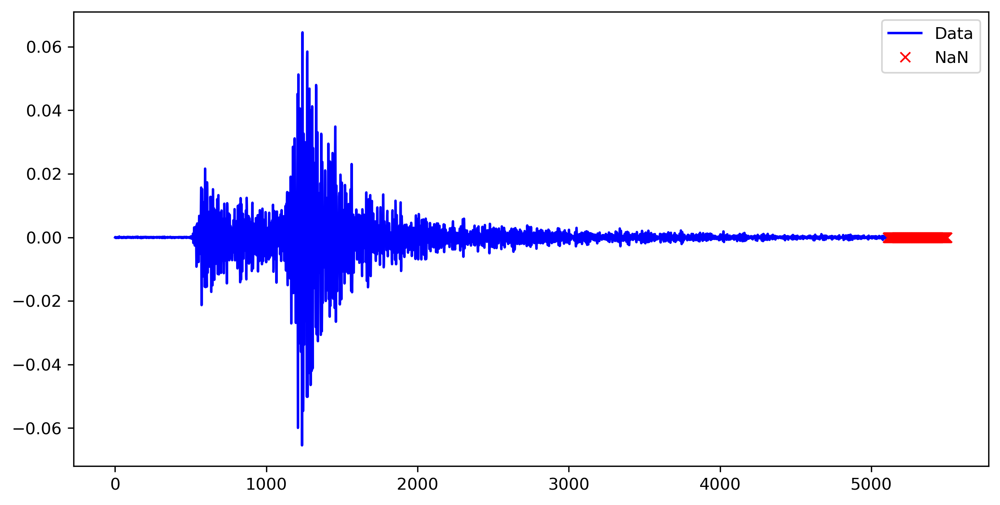

In [23]:
sample_idx = 1
waveform = waveforms[0, :, sample_idx]
plot_nans(waveform)

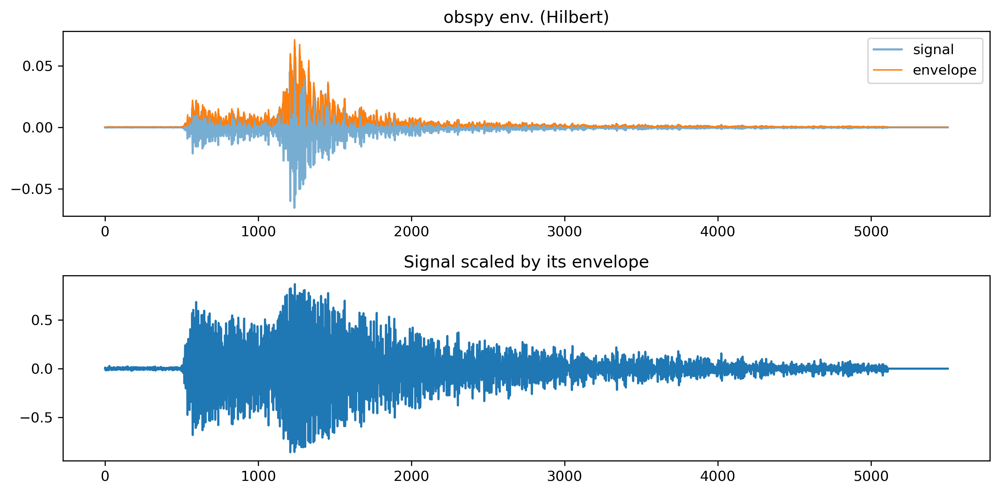

False


In [24]:
waveform = np.nan_to_num(waveform, nan=0) # since it seems that the NaNs are at the edges of the signal, we can just replace them with 0
plot_envelope(waveform, title='obspy env. (Hilbert)', envelope_function=obspy.signal.filter.envelope)

print(np.any(np.isnan(waveform)))

In [77]:
def _centered_window(x, window_len):
    assert window_len % 2, 'Centered Window has to have odd length'
    mid = window_len // 2
    pos = 0
    while pos < len(x):
        yield x[max(pos - mid, 0): min(pos + mid + 1, len(x))]
        pos += 1

def centered_max(x, window_len):
    out = [window.max() for window in _centered_window(x, window_len)]
    return np.array(out)

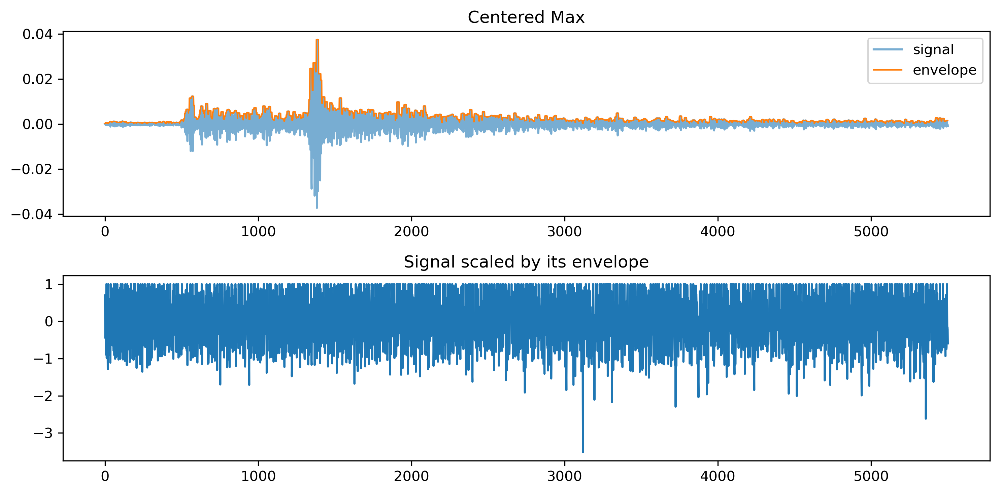

In [83]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=15)

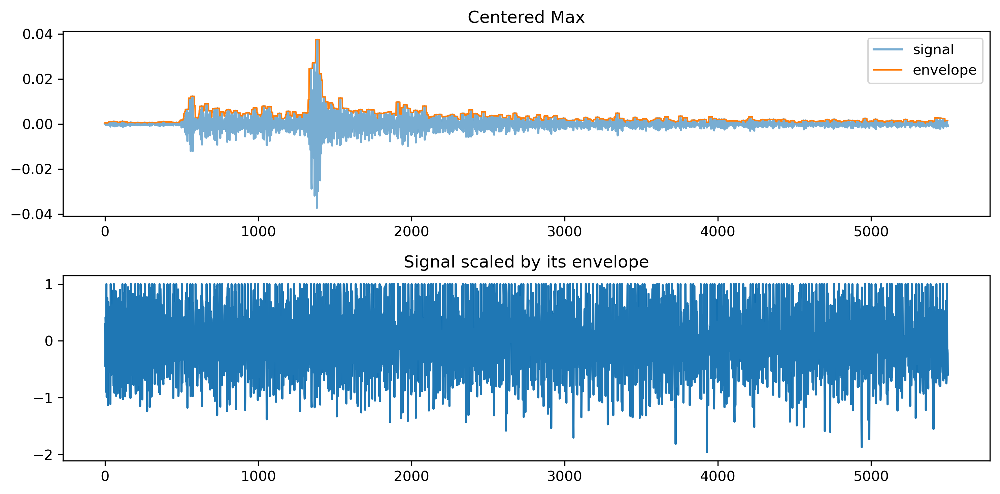

In [84]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=25)

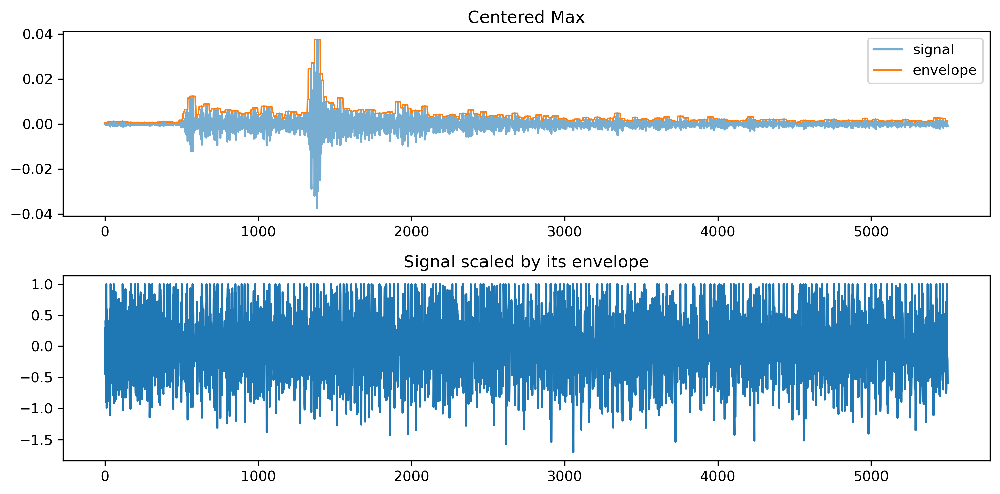

In [85]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, :, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=35)

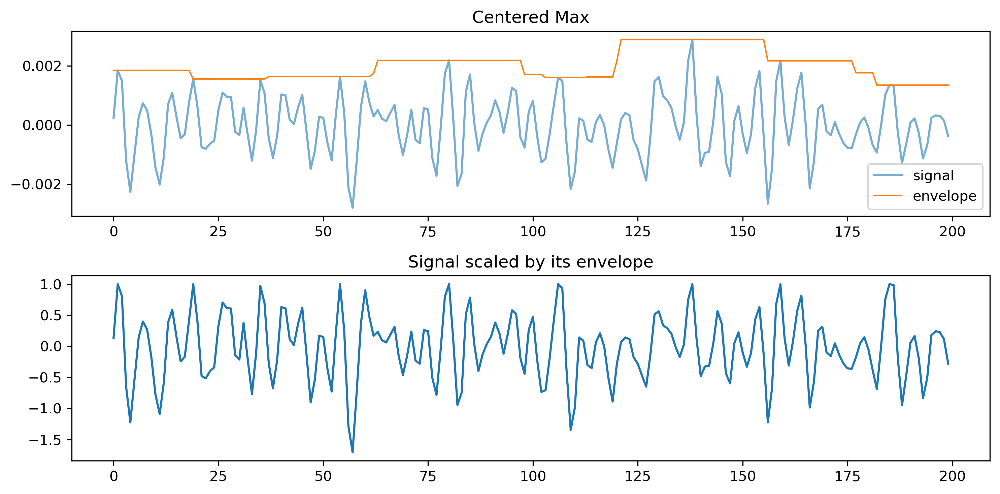

In [87]:
sample_idx = 9
waveform = np.nan_to_num(waveforms[0, 3000:3200, sample_idx], nan=0)

plot_envelope(waveform, title='Centered Max', envelope_function=centered_max, window_len=35)

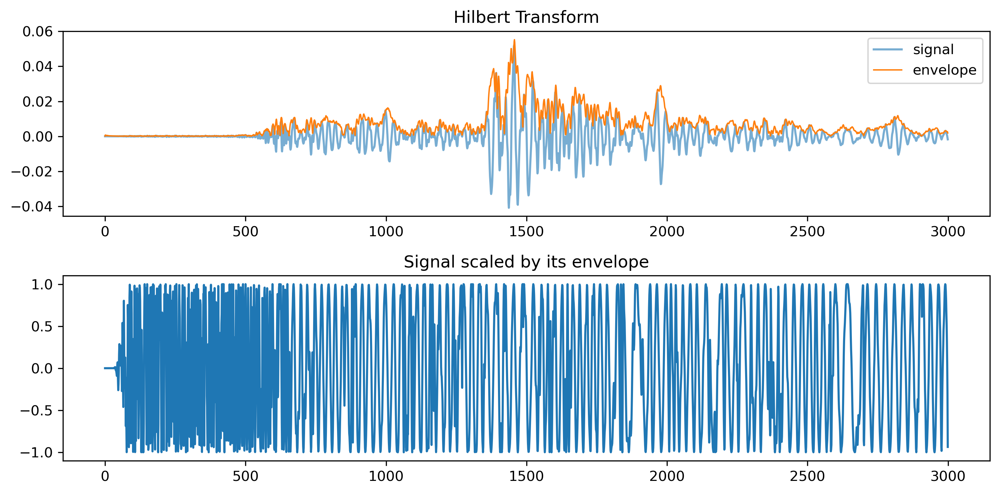

In [40]:
from scipy.signal import hilbert


sample_idx = 0
waveform = np.nan_to_num(waveforms[0, :3000, sample_idx], nan=0) # since it seems that the NaNs are at the edges of the signal, we can just replace them with 0
env, sig_scaled, _ = plot_envelope(waveform, title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

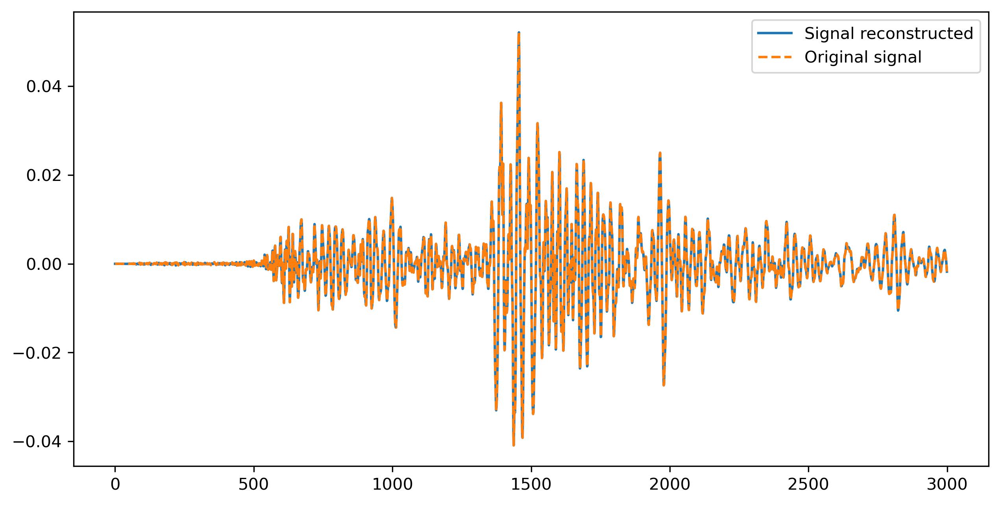

In [43]:
plt.plot(env*sig_scaled, label='Signal reconstructed')
plt.plot(waveform, '--', label='Original signal')
plt.legend()

# Envelope Statistics
Computing the mean and the standard deviation for the envelopes of the training dataset. Trying differents transformation to map envelopes in a small value range (even after normalization).

In [5]:
argmax_flat = np.nanargmax(waveforms)
argmax = np.unravel_index(argmax_flat, waveforms.shape)
np.nanmax(waveforms), argmax_flat, argmax

(10.896939739481624, 614522595, (1, 644, 22595))

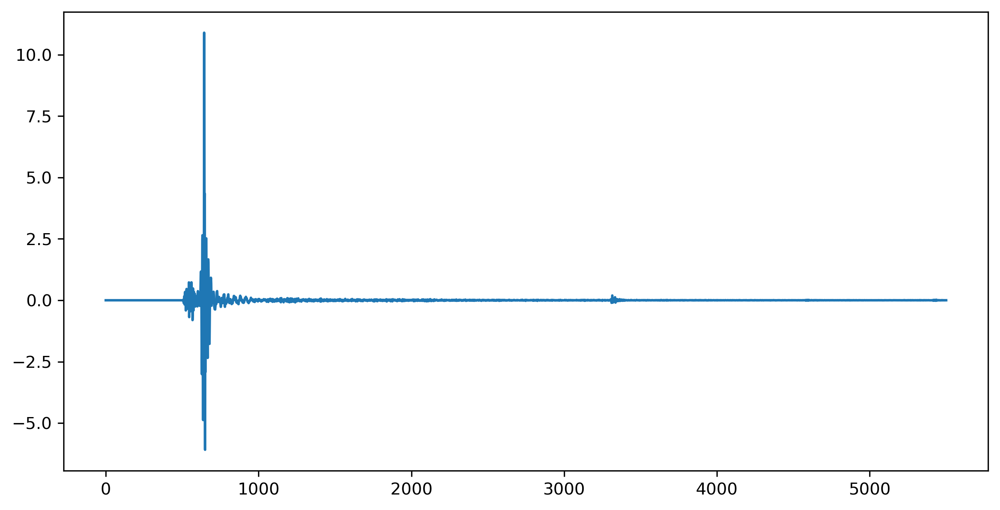

In [6]:
plt.plot(waveforms[argmax[0], :, argmax[-1]])

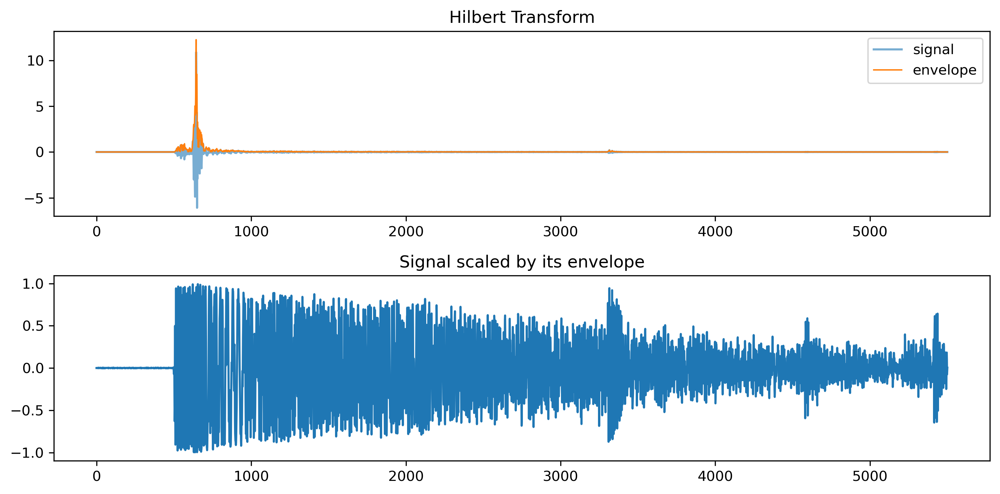

(array([0.0001829 , 0.00012817, 0.00014786, ..., 0.00101411, 0.00060474,
        0.00022102]),
 array([-0.00030142, -0.00027264,  0.00065588, ..., -0.07587837,
        -0.0299515 ,  0.00381588]),
 637)

In [7]:
from scipy.signal import hilbert
plot_envelope(waveforms[argmax[0], :, argmax[-1]], title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

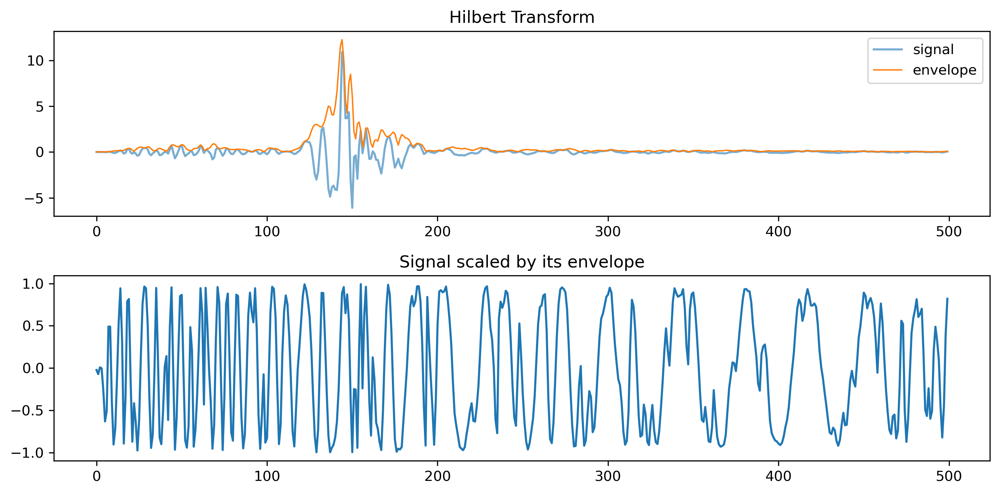

In [8]:
_,_,_ = plot_envelope(waveforms[argmax[0], 500:1000, argmax[-1]], title='Hilbert Transform', envelope_function=lambda x: np.abs(hilbert(x)))

### Mean and Std of a subset of the dataset 

In [9]:
n = waveforms.shape[-1]
waveforms = np.nan_to_num(waveforms, nan=0)

mean = np.mean(waveforms, axis=2)
std_dev = np.std(waveforms, axis=2)

n, mean.shape, std_dev.shape

(100000, (3, 5501), (3, 5501))

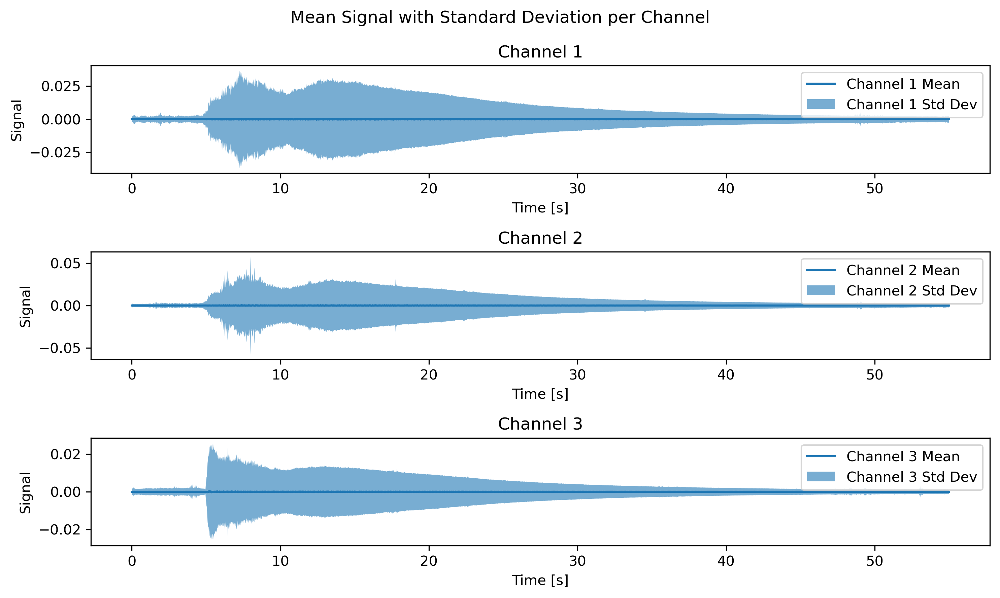

In [11]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Signal with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, mean[i] - std_dev[i], mean[i] + std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [12]:
signal_statistics = {}

for i in range(mean.shape[0]):
    signal_statistics[f'ch{i+1}'] = {'mean': mean[i], 'std_dev': std_dev[i]}

signal_statistics['ch1']['mean'].shape, signal_statistics['ch1']['std_dev'].shape

((5501,), (5501,))

In [13]:
import pickle

with open('signal_statistics.pkl', 'wb') as f:
    pickle.dump(signal_statistics, f)

In [14]:
!ls

envelope.ipynb	  generate_samples.ipynb       test_dataset.ipynb
evaluation.ipynb  random_data_generator.ipynb  test_diffusion.ipynb
filter.ipynb	  signal_statistics.pkl


## Mean and Std of the envelope of the signals

### Hilbert transform

In [15]:
envelopes = np.abs(hilbert(waveforms))
envelopes.shape

(3, 5501, 100000)

In [16]:
env_mean = np.mean(envelopes, axis=2)
env_std_dev = np.std(envelopes, axis=2)

n, env_mean.shape, env_std_dev.shape

(100000, (3, 5501), (3, 5501))

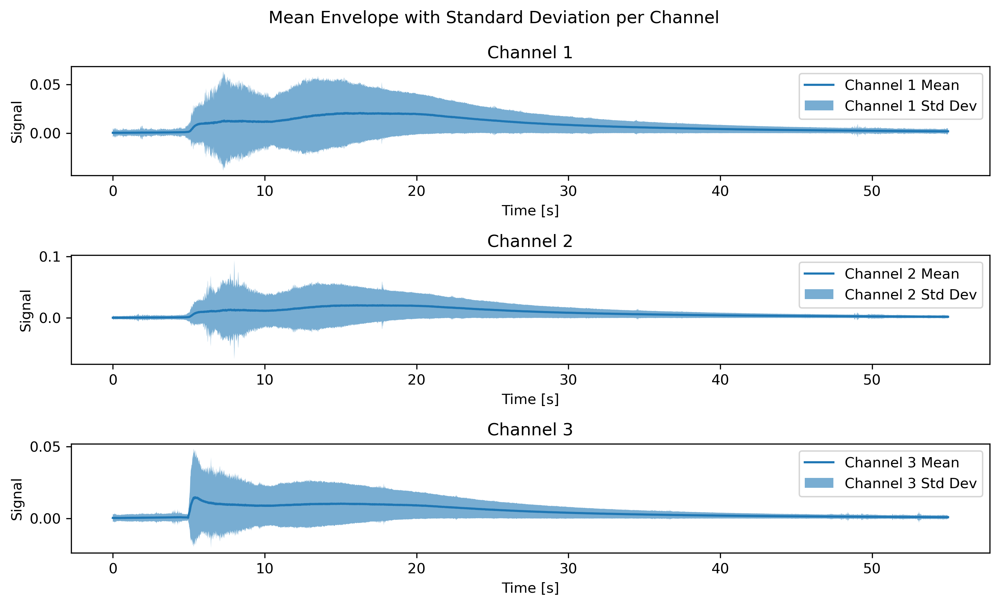

In [17]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Envelope with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , env_mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, env_mean[i] - env_std_dev[i], env_mean[i] + env_std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

#### Envelope Transformation

The following is to show what happen if we normalize the envelope of the maximum signal with the envelope mean and standard deviation.

In [18]:
scaled_env_max_signal = ((np.abs(hilbert(waveforms[argmax[0], :, argmax[-1]])) - env_mean[argmax[0]])/env_std_dev[argmax[0]])
scaled_env_max_signal.shape

(5501,)

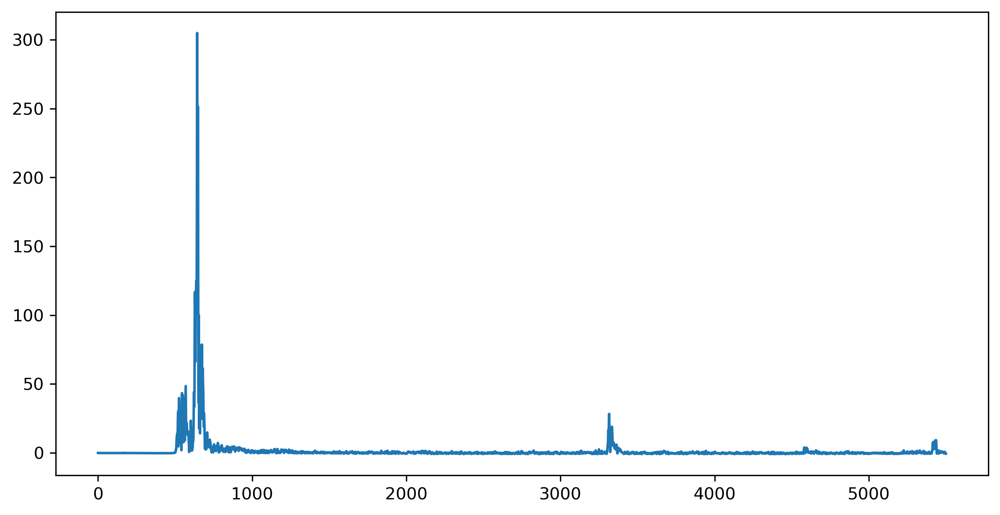

In [19]:
plt.plot(scaled_env_max_signal)

and to the envelope of a random signal. 

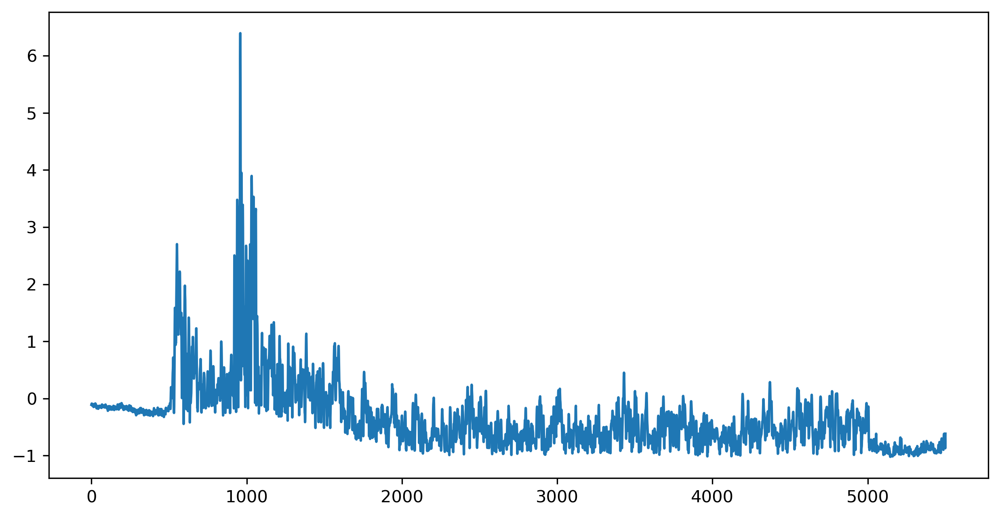

In [20]:
scaled_env_random_signal = ((np.abs(hilbert(waveforms[0, :, 5])) - env_mean[0])/env_std_dev[0])
plt.plot(scaled_env_random_signal)

Appling a log tranform:

In [21]:
def log_transform(x):
    return np.log(1 + x)

to the envelope of the maximum signal

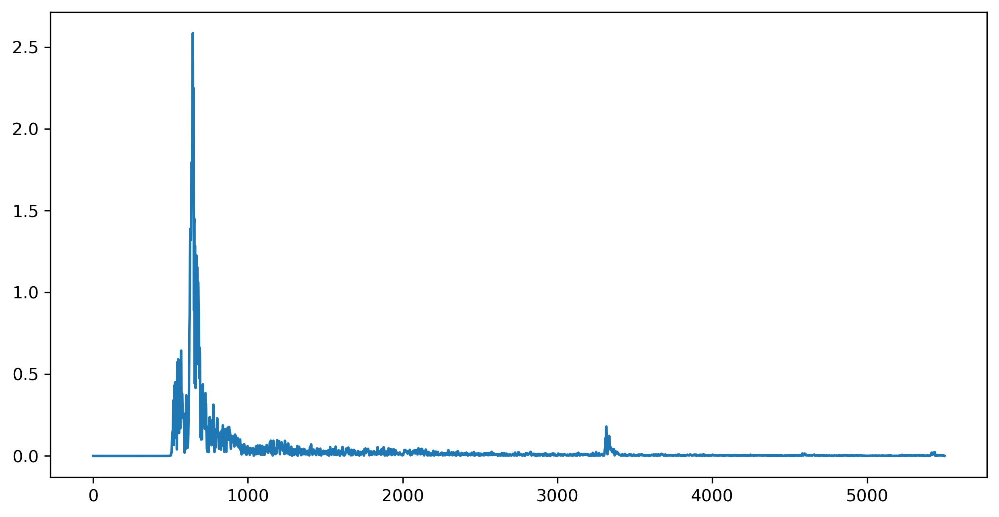

In [22]:
plt.plot(log_transform(
    (np.abs(
        hilbert(waveforms[argmax[0], :, argmax[-1]])
        )
    )
))

and to the envelope of the random signal 

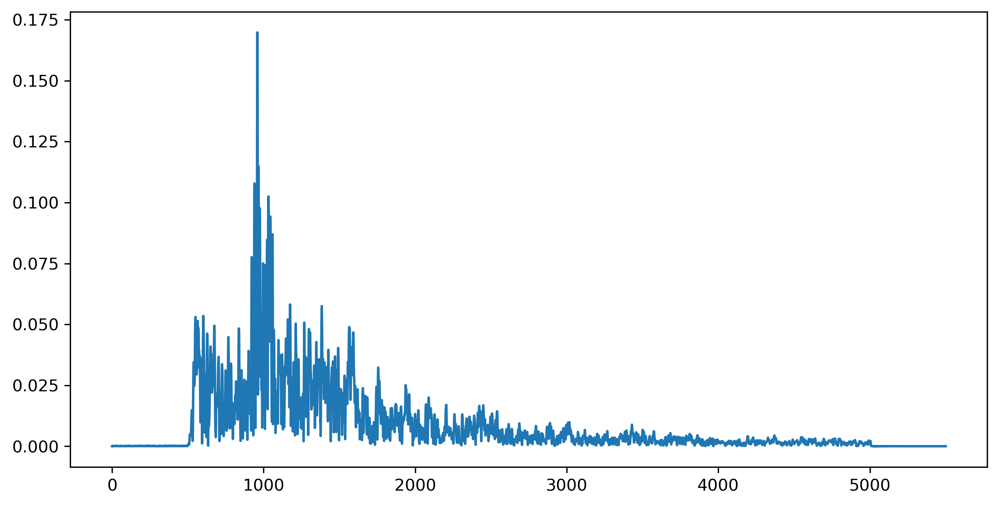

In [23]:
plt.plot(log_transform(np.abs(hilbert(waveforms[0, :, 5]))))

Range of values is now smaller. 

Let's compute the statistics of this transformed envelopes. 

In [24]:
transformed_envelopes = log_transform(envelopes)
envelopes.shape, transformed_envelopes.shape

((3, 5501, 100000), (3, 5501, 100000))

In [25]:
trans_env_mean = np.mean(transformed_envelopes, axis=2)
trans_env_std_dev = np.std(transformed_envelopes, axis=2)

n, trans_env_mean.shape, trans_env_std_dev.shape

(100000, (3, 5501), (3, 5501))

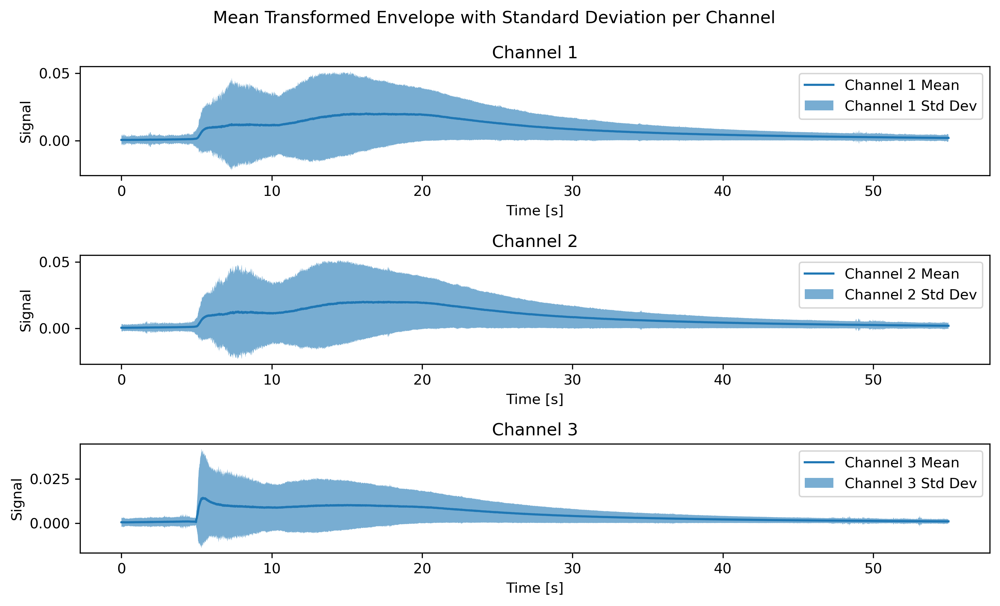

In [26]:
fs = 100 # [Hz] (sampling frequency)
time_axis = np.arange(0, waveforms.shape[1])/fs

fig, axs = plt.subplots(3, figsize=(10, 6))
fig.suptitle('Mean Transformed Envelope with Standard Deviation per Channel')

for i in range(mean.shape[0]):
    axs[i].plot(time_axis , trans_env_mean[i], label=f'Channel {i+1} Mean') 
    axs[i].fill_between(time_axis, trans_env_mean[i] - trans_env_std_dev[i], trans_env_mean[i] + trans_env_std_dev[i], alpha=0.6, label=f'Channel {i+1} Std Dev') 
    axs[i].set_title(f'Channel {i+1}')
    axs[i].set_xlabel('Time [s]')
    axs[i].set_ylabel('Signal')
    axs[i].legend()

plt.tight_layout()
plt.show()

In [29]:
scaled_trans_env_max_signal = (log_transform(np.abs(hilbert(waveforms[argmax[0], :, argmax[-1]]))) 
                               - trans_env_mean[argmax[0]]) / trans_env_std_dev[argmax[0]]

scaled_trans_env_max_signal.shape

(5501,)

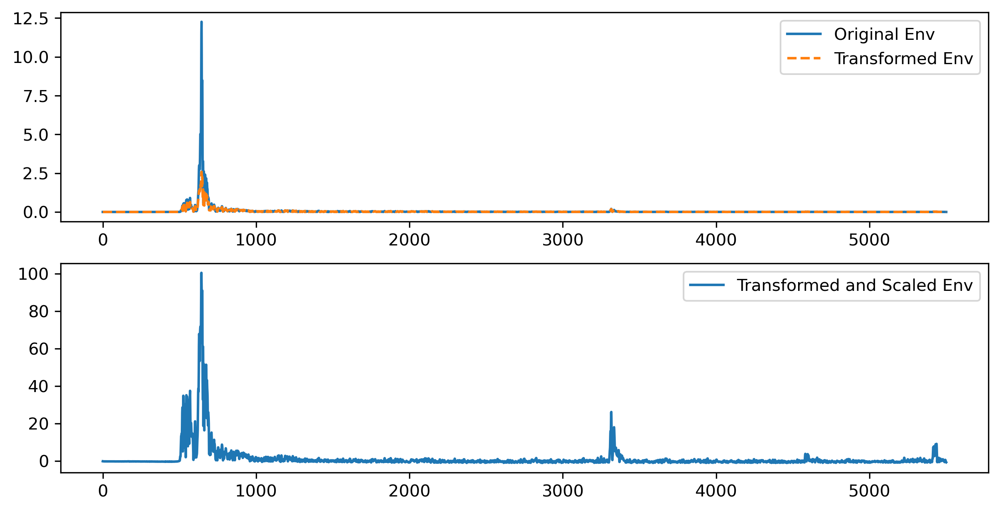

In [30]:
fig, axs = plt.subplots(2, 1)
axs[0].plot(np.abs(hilbert(waveforms[argmax[0], :, argmax[-1]])), label='Original Env')
axs[0].plot(log_transform(np.abs(hilbert(waveforms[argmax[0], :, argmax[-1]]))), '--', label='Transformed Env')
axs[0].legend()
axs[1].plot(scaled_trans_env_max_signal, label='Transformed and Scaled Env')
axs[1].legend()

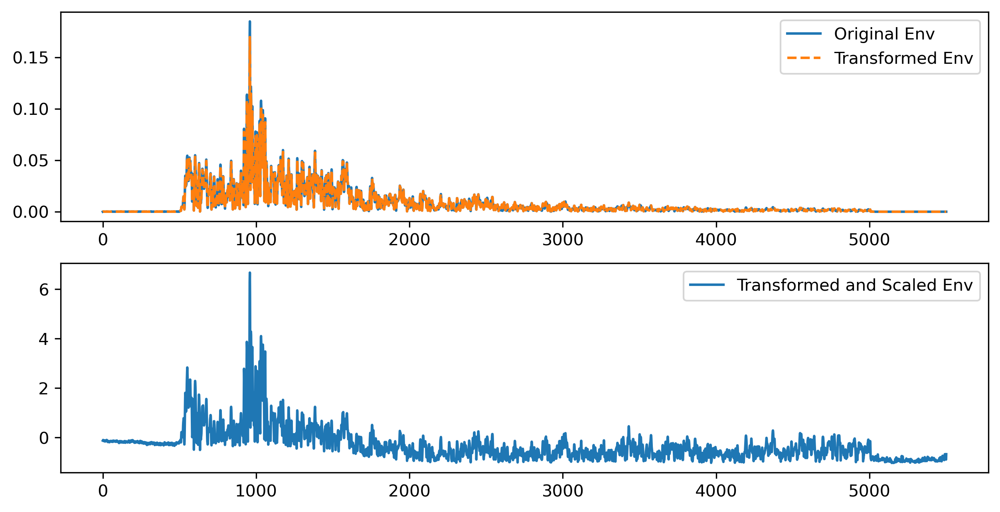

In [28]:
scaled_transf_env_random_signal = ((log_transform(np.abs(hilbert(waveforms[0, :, 5]))) - trans_env_mean[0]) / trans_env_std_dev[0])
fig, axs = plt.subplots(2, 1)
axs[0].plot(np.abs(hilbert(waveforms[0, :, 5])), label='Original Env')
axs[0].plot(log_transform(np.abs(hilbert(waveforms[0, :, 5]))), '--', label='Transformed Env')
axs[0].legend()
axs[1].plot(scaled_transf_env_random_signal, label='Transformed and Scaled Env')
axs[1].legend()

Conclusion: since the Standard Deviation of the Transformed Envelopes (trans_env_std_dev) is generally small (i.e., smaller than one), when we devide the Trannsformed Envelope by the trans_env_std_dev we get high values. 

In [32]:
np.mean(trans_env_std_dev), np.std(trans_env_std_dev), np.min(trans_env_std_dev), np.max(trans_env_std_dev)

(0.009858916493228327,
 0.009069823928736336,
 0.001053069738343601,
 0.03578168377440516)